zsh:1: command not found: mamba


In [1]:
!pip install pyalex
!pip install opinionated
!pip install datamapplot


[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: pip install --upgrade pip
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 40.7 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 33.4 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.0/14.0 MB 40.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.5/313.5 kB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.1/31.1 MB 37.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 225.5/225.5 kB 5.1 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.3/78.3 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 260.3/260.3 kB 12.8

In [2]:
# https://openalex.org/

from pyalex import Works, Authors, Sources, Institutions, Concepts, Publishers, Funders
import pyalex
pyalex.config.email = "maximilian.noichl@uni-bamberg.de"

from itertools import chain
from tqdm.auto import tqdm

from compress_pickle import dump, load



In [8]:
from pyalex import Works
import pandas as pd


# https://openalex.org/works?page=1&filter=default.search%3A%22Personality%22%20AND%20%22Life%20Outcomes%22
# Create a query with the specified search terms
# "Although other reports of successful treatment with antibiotics or observation of bacteria in the stomach occasionally surfaced, the bacterial hypothesis was not seriously investigated until the late 1970s. 
# At the 1978 meeting of the American Gastroenterology Association, it appeared that tide had begun to turn.""
query = Works().search(['peptic ulcer']).filter(publication_year="<1978")
#.search(['"Personality" AND "Life outcomes"']).filter(publication_year=">2020")

records= []
for record in chain(*query.paginate(per_page=99,n_max=None)):
    records.append(record)
    print(len(records))



1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [9]:
df = pd.DataFrame(records)
df

,id,doi,title,display_name,relevance_score,publication_year,publication_date,ids,language,primary_location,...,referenced_works_count,referenced_works,related_works,ngrams_url,abstract_inverted_index,cited_by_api_url,counts_by_year,updated_date,created_date,fulltext_origin
0,https://openalex.org/W1976754613,https://doi.org/10.1056/nejm197602262940905,Nonassociation of Adrenocorticosteroid Therapy...,Nonassociation of Adrenocorticosteroid Therapy...,1924.987500,1976,1976-02-26,{'openalex': 'https://openalex.org/W1976754613...,en,"{'is_oa': False, 'landing_page_url': 'https://...",...,49,"[https://openalex.org/W1467875944, https://ope...","[https://openalex.org/W3199975325, https://ope...",https://api.openalex.org/works/W1976754613/ngrams,"{'IT': [0], 'is': [1, 6, 35], '""known""': [2], ...",https://api.openalex.org/works?filter=cites:W1...,"[{'year': 2023, 'cited_by_count': 4}, {'year':...",2024-05-17T03:39:23.486893,2016-06-24,NaN
1,https://openalex.org/W2318051686,https://doi.org/10.1056/nejm197402282900901,"Cigarettes, Alcohol, Coffee and Peptic Ulcer","Cigarettes, Alcohol, Coffee and Peptic Ulcer",1805.952000,1974,1974-02-28,{'openalex': 'https://openalex.org/W2318051686...,en,"{'is_oa': False, 'landing_page_url': 'https://...",...,16,"[https://openalex.org/W1548484032, https://ope...","[https://openalex.org/W3032156516, https://ope...",https://api.openalex.org/works/W2318051686/ngrams,"{'Abstract': [0], 'The': [1], 'relation': [2, ...",https://api.openalex.org/works?filter=cites:W2...,"[{'year': 2024, 'cited_by_count': 1}, {'year':...",2024-06-06T03:45:09.287935,2016-06-24,NaN
2,https://openalex.org/W1976875134,https://doi.org/10.1001/jama.1973.03220170019004,"Hypertension, Peptic Ulcer, and Diabetes in Ai...","Hypertension, Peptic Ulcer, and Diabetes in Ai...",1592.283100,1973,1973-04-23,{'openalex': 'https://openalex.org/W1976875134...,en,"{'is_oa': False, 'landing_page_url': 'https://...",...,5,"[https://openalex.org/W2020360663, https://ope...","[https://openalex.org/W645983410, https://open...",https://api.openalex.org/works/W1976875134/ngrams,"{'The': [0, 37], 'hypothesis': [1, 72], 'that'...",https://api.openalex.org/works?filter=cites:W1...,"[{'year': 2022, 'cited_by_count': 2}, {'year':...",2024-05-15T09:42:16.853409,2016-06-24,ngrams
3,https://openalex.org/W2073910916,https://doi.org/10.1097/00000658-192304000-00006,THE EXPERIMENTAL PRODUCTION OF PEPTIC ULCER,THE EXPERIMENTAL PRODUCTION OF PEPTIC ULCER,1566.134200,1923,1923-04-01,{'openalex': 'https://openalex.org/W2073910916...,en,"{'is_oa': False, 'landing_page_url': 'https://...",...,1,[https://openalex.org/W2018932967],"[https://openalex.org/W4389568370, https://ope...",https://api.openalex.org/works/W2073910916/ngrams,None,https://api.openalex.org/works?filter=cites:W2...,"[{'year': 2023, 'cited_by_count': 2}, {'year':...",2024-05-24T08:01:09.745634,2016-06-24,NaN
4,https://openalex.org/W2320705810,https://doi.org/10.1056/nejm197405232902102,Aspirin Use in Patients with Major Upper Gastr...,Aspirin Use in Patients with Major Upper Gastr...,1398.974100,1974,1974-05-23,{'openalex': 'https://openalex.org/W2320705810...,en,"{'is_oa': False, 'landing_page_url': 'https://...",...,20,"[https://openalex.org/W1970223134, https://ope...","[https://openalex.org/W3199975325, https://ope...",https://api.openalex.org/works/W2320705810/ngrams,"{'Possible': [0], 'relations': [1], 'between':...",https://api.openalex.org/works?filter=cites:W2...,"[{'year': 2022, 'cited_by_count': 1}, {'year':...",2024-05-14T10:41:27.443199,2016-06-24,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41471,https://openalex.org/W2501941999,https://doi.org/10.5962/bhl.title.31118,Old Jim Avery's own farrier and recipe book : ...,Old Jim Avery's own farrier and recipe book : ...,0.049490,1859,1859-01-01,{'openalex': 'https://openalex.org/W2501941999...,en,"{'is_oa': False, 'landing_page_url': 'https://...",...,0,[],"[https://openalex.org/W3183948672, http

In [10]:
all_referenced_works = [x for y in df['referenced_works'] for x in y]


# all_unique_referenced_works = list(set(all_referenced_works))

# from collections import Counter

# def remove_less_frequent_items(lst, n):
#     counts = Counter(lst)
#     return [item for item in lst if counts[item] > n]

# # Set to 0 for full set:
# n = 0
# filtered_referenced_works = remove_less_frequent_items(all_referenced_works, n) # remove 
# print(len(filtered_referenced_works))

filtered_referenced_works = list(set(all_referenced_works)) #remove duplicates from download list.
additional_works_to_download = [x for x in filtered_referenced_works if x not in  df['id']]



all_aditional_records =[]
block_len = 99
# Loop in blocks of 50
for i in tqdm(range(0, len(additional_works_to_download), block_len)):
    sublist = additional_works_to_download[i:i+block_len]
    ID_str = "|".join([x.replace('https://openalex.org/','') for  x in sublist])
    record_list = Works().filter(openalex_id=ID_str).get(per_page=block_len)
    #print(len(record_list))
    for this_record in record_list:
        all_aditional_records.append(this_record)



  0%|          | 0/1316 [00:00<?, ?it/s]

In [11]:
all_additional_records_df = pd.DataFrame(all_aditional_records)

In [12]:
all_additional_records_df

,id,doi,title,display_name,publication_year,publication_date,ids,language,primary_location,type,...,referenced_works_count,referenced_works,related_works,ngrams_url,abstract_inverted_index,cited_by_api_url,counts_by_year,updated_date,created_date,fulltext_origin
0,https://openalex.org/W1547203551,https://doi.org/10.1016/s0021-9258(18)71179-4,THE FREE AMINO ACIDS OF HUMAN BLOOD PLASMA,THE FREE AMINO ACIDS OF HUMAN BLOOD PLASMA,1954,1954-12-01,{'openalex': 'https://openalex.org/W1547203551...,en,"{'is_oa': True, 'landing_page_url': 'https://d...",article,...,38,"[https://openalex.org/W128676192, https://open...","[https://openalex.org/W2397056885, https://ope...",https://api.openalex.org/works/W1547203551/ngrams,None,https://api.openalex.org/works?filter=cites:W1...,"[{'year': 2024, 'cited_by_count': 3}, {'year':...",2024-05-21T13:02:47.261679,2016-06-24,NaN
1,https://openalex.org/W2067856914,https://doi.org/10.1126/science.144.3624.1344,Antibodies to Bradykinin and Angiotensin: A Us...,Antibodies to Bradykinin and Angiotensin: A Us...,1964,1964-06-12,{'openalex': 'https://openalex.org/W2067856914...,en,"{'is_oa': False, 'landing_page_url': 'https://...",article,...,5,"[https://openalex.org/W1986094359, https://ope...","[https://openalex.org/W4313309038, https://ope...",https://api.openalex.org/works/W2067856914/ngrams,"{'Antibodies': [0], 'to': [1], 'bradykinin': [...",https://api.openalex.org/works?filter=cites:W2...,"[{'year': 2020, 'cited_by_count': 1}, {'year':...",2024-05-21T20:38:12.815370,2016-06-24,ngrams
2,https://openalex.org/W4300439622,https://doi.org/10.1016/s0011-393x(03)00075-4,Current Therapeutic Research,Current Therapeutic Research,2003,2003-04-01,{'openalex': 'https://openalex.org/W4300439622...,en,"{'is_oa': False, 'landing_page_url': 'https://...",article,...,0,[],"[https://openalex.org/W3108674512, https://ope...",https://api.openalex.org/works/W4300439622/ngrams,None,https://api.openalex.org/works?filter=cites:W4...,"[{'year': 2024, 'cited_by_count': 1}, {'year':...",2024-06-07T20:33:52.312240,2022-10-03,NaN
3,https://openalex.org/W2166468225,https://doi.org/10.1016/s0140-6736(73)92873-0,INHIBITION OF INSULIN SECRETION BY SOMATOSTATIN,INHIBITION OF INSULIN SECRETION BY SOMATOSTATIN,1973,1973-12-01,{'openalex': 'https://openalex.org/W2166468225...,en,"{'is_oa': False, 'landing_page_url': 'https://...",article,...,8,"[https://openalex.org/W1965939829, https://ope...","[https://openalex.org/W4319063296, https://ope...",https://api.openalex.org/works/W2166468225/ngrams,"{'Injection': [0], 'of': [1, 51], 'somatostati...",https://api.openalex.org/works?filter=cites:W2...,"[{'year': 2022, 'cited_by_count': 6}, {'year':...",2024-06-04T15:41:26.096721,2016-06-24,ngrams
4,https://openalex.org/W67356013,https://doi.org/10.1093/jnci/11.6.1269,A Method of Estimating Comparative Rates from ...,A Method of Estimating Comparative Rates from ...,1951,1951-06-01,"{'openalex': 'https://openalex.org/W67356013',...",en,"{'is_oa': False, 'landing_page_url': 'https://...",article,...,0,[],"[https://openalex.org/W377899687, https://open...",https://api.openalex.org/works/W67356013/ngrams,None,https://api.openalex.org/works?filter=cites:W6...,"[{'year': 2024, 'cited_by_count': 3}, {'year':...",2024-06-06T08:08:59.522033,2016-06-24,ngrams
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130058,https://openalex.org/W2346421799,https://doi.org/10.1016/s0025-7125(16)36552-x,The Clinical Application of Electroencephalogr...,The Clinical Application of Electroencephalogr...,1941,1941-09-01,{'openalex': 'https://openalex.org/W2346421799...,en,"{'is_oa': False, 'landing_page_url': 'https://...",review,...,12,"[https://openalex.org/W1997844013, https://ope...","[https://openalex.org/W4389568370, https://ope...",https://api.openalex.org/works/W2346421799/ngrams,None,https://api.openalex.org/works?filter=cites:W2...,"[{'year': 2020, 'cited_by_count': 1}]",2024-05-13T22:46:08.701731,2016-06-24,ngrams
13

In [13]:
total_record_set = pd.concat([df, all_additional_records_df])

In [14]:
import networkx as nx
import json


# Create a directed graph
G = nx.DiGraph()


# Add nodes and edges
for ix,row in tqdm(df.iterrows()):
    for author in row['authorships']:
        this_author = author['author']['id'] 
        
        if this_author not in G.nodes():
            G.add_node(this_author)
            G.nodes()[this_author]['authored_paper_count'] = 1
            G.nodes()[this_author]['cited_count'] = 0
            G.nodes()[this_author]['titles'] = [row['title']]
            

        else:
            G.nodes()[this_author]['authored_paper_count'] += 1
            G.nodes()[this_author]['titles'].append(row['title'])
        
        
        for cited_work_id in row["referenced_works"]:
            cited_work = all_additional_records_df[all_additional_records_df['id'] == cited_work_id] # This fails silently if citations are not present!
            if len(cited_work) >= 1: # In case of multiple hits (shouldn't happen once sampling is fixed)
                cited_work = cited_work.iloc[0]
                
            for cited_author in cited_work['authorships']:
                cited_author = cited_author['author']['id'] 
                
                if cited_author not in G.nodes():
                    G.add_node(cited_author)
                    G.nodes()[cited_author]['cited_count'] = 1
                    G.nodes()[cited_author]['authored_paper_count'] = 0
                    G.nodes()[cited_author]['titles'] = [cited_work['title']]
                    
                else:
                    G.nodes()[cited_author]['cited_count'] += 1
                    G.nodes()[cited_author]['titles'].append(cited_work['title'])
                
                
                if G.has_edge(this_author, cited_author):  # edges go FROM citing TO cited
                    G[this_author][cited_author]['weight'] += 1
                else:
                    G.add_edge(this_author, cited_author, weight=1)
                        
                

    # for 
#     G.add_node(item["id"])  # Add each work as a node
#     for related in item["referenced_works"]:
#         G.add_edge(item["id"], related)  # Create an edge from this work to each related work

# # Optionally, you can print the nodes and edges to verify
print("Nodes in the network:")
print(len(G.nodes()))
# print("Edges in the network:")
# print(len(G.edges()))
G.nodes(data=True)
print("Edges in the network:")
print(len(G.edges()))

0it [00:00, ?it/s]

Nodes in the network:
147515
Edges in the network:
786167


In [15]:
# Extract largest component:
largest_cc = max(nx.weakly_connected_components(G), key=len)
G = G.subgraph(largest_cc)

In [16]:
import dill

with open('peptic_ulcer_graph_pre_1978.pkl', 'wb') as f:
    dill.dump(G, f)

11.769645360299243
3.0


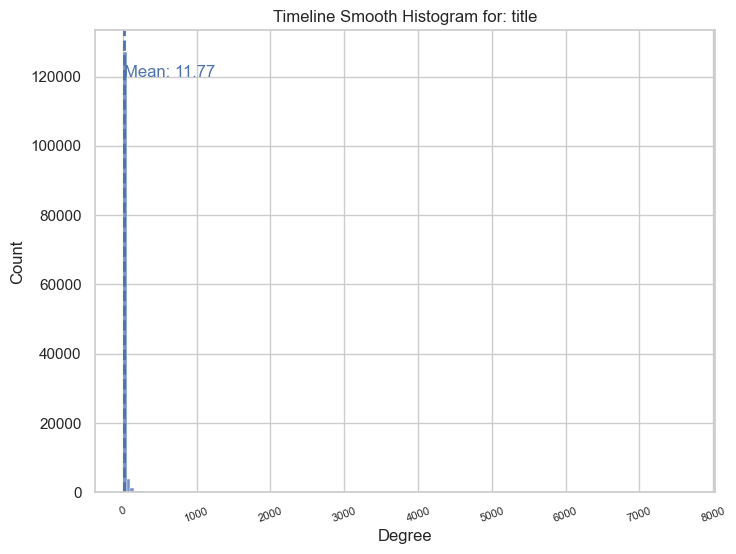

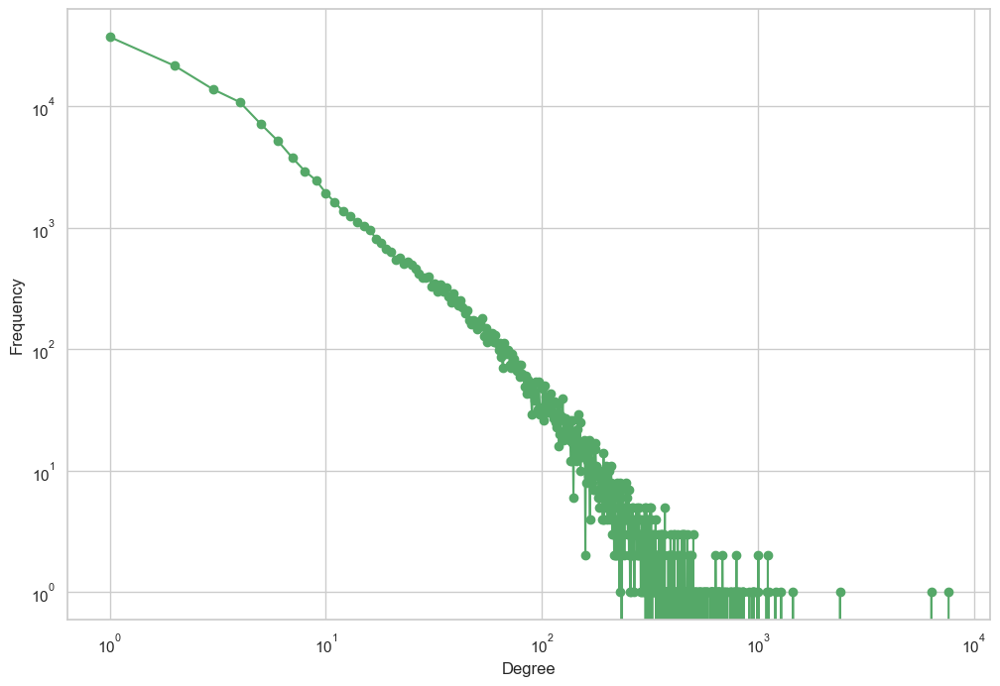

In [17]:
# Plotting functions
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

def plot_network_degree_distribution(G, title):
    degrees = np.array([degree for node, degree in G.degree()])
    # Create the histogram with a KDE
    sns.set(style="whitegrid")
    plt.figure(figsize=(8, 6))
    sns.histplot(degrees, kde=False, bins=150, stat="count")
    # Calculate the mean
    mean_value = np.mean(degrees)
    print(mean_value)
    print(np.median(degrees))

    # Plot a vertical line at the mean value
    plt.axvline(mean_value, color='b', linestyle='--', linewidth=2)
    plt.text(mean_value + 0.1, plt.ylim()[1] * 0.9, 'Mean: {:.2f}'.format(mean_value), color='b')

    plt.title('Timeline Smooth Histogram for: ' + title)
    plt.xlabel('Degree')
    plt.ylabel('Count')
    plt.xticks(fontsize=8,rotation=20)
    plt.show()
    
def plot_loglog(G,m=10):
    degree_freq = nx.degree_histogram(G)
    degrees = range(len(degree_freq))
    plt.figure(figsize=(12, 8))
    plt.loglog(degrees[m:], degree_freq[m:],'go-')
    plt.xlabel('Degree')
    plt.ylabel('Frequency')

plot_network_degree_distribution(G, 'title')
plot_loglog(G,m=1)

# Run until here!!

In [10]:
nodes_with_one_link = [node for node, degree in G.degree() if degree <= 1]

G_more_than_one_link = G.copy()
#G_more_than_one_link.remove_nodes_from(nodes_with_one_link)


In [11]:
print("Nodes in the network:")
print(len(G_more_than_one_link.nodes()))

print("Edges in the network:")
print(len(G_more_than_one_link.edges()))

Nodes in the network:
190462
Edges in the network:
1303894


In [12]:
#conda install -c conda-forge graph-tool


In [13]:
import graph_tool.all as gt

# Convert NetworkX graph to graph_tool graph
g = gt.Graph(directed=True)

# Create a mapping from NetworkX nodes to graph_tool vertices
node_map = {n: g.add_vertex() for n in G_more_than_one_link.nodes()}

# Add edges to the graph_tool graph
for u, v in G_more_than_one_link.edges():
    g.add_edge(node_map[u], node_map[v])

# Optionally, you can print the graph_tool graph's vertices and edges to verify
print("Nodes in the graph_tool network:")
print(g.num_vertices())
print("Edges in the graph_tool network:")
print(g.num_edges())

Nodes in the graph_tool network:
190462
Edges in the graph_tool network:
1303894


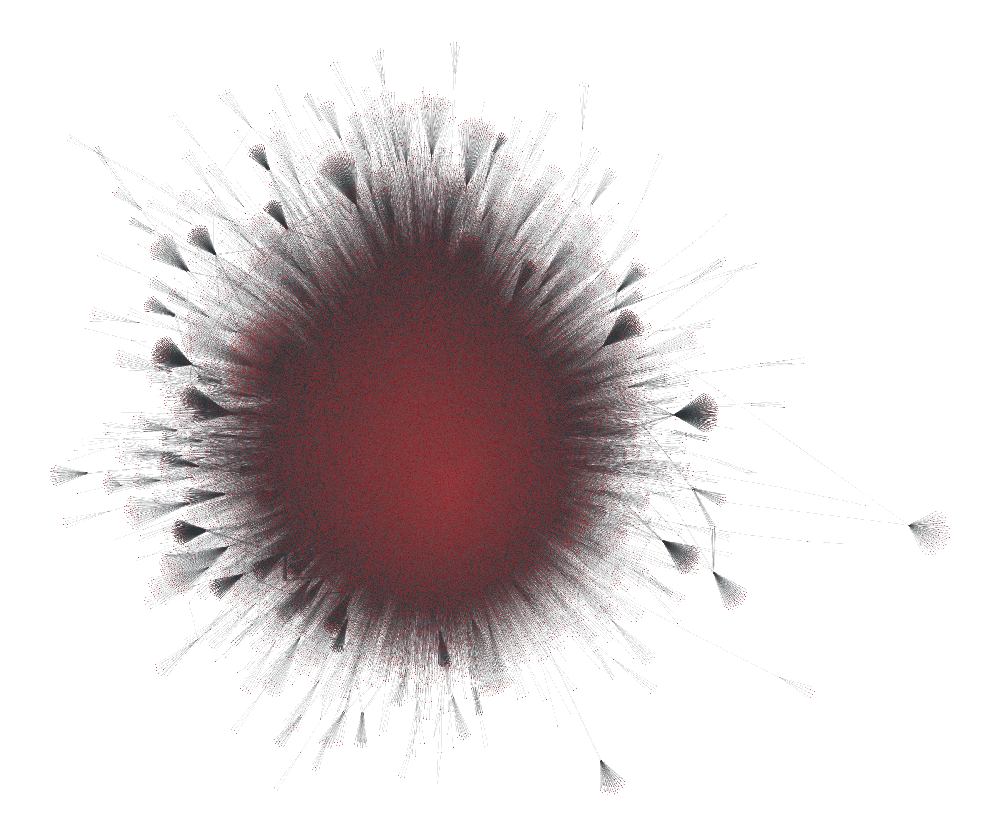

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x54661d1f0, at 0x4ee11e4e0>

In [14]:
from graph_tool.all import *
import matplotlib
import numpy as np

#g = extract_largest_component(g, directed=False)
pos = sfdp_layout(g)


dprms = dict(fmt="png",  output_size=(1200, 1200))

graph_draw(g, pos, **dprms)
        #    , vertex_fill_color=g.vp.value, vcmap=matplotlib.cm.coolwarm,
        #    vcnorm=matplotlib.colors.Normalize(vmin=0, vmax=1), **dprms)

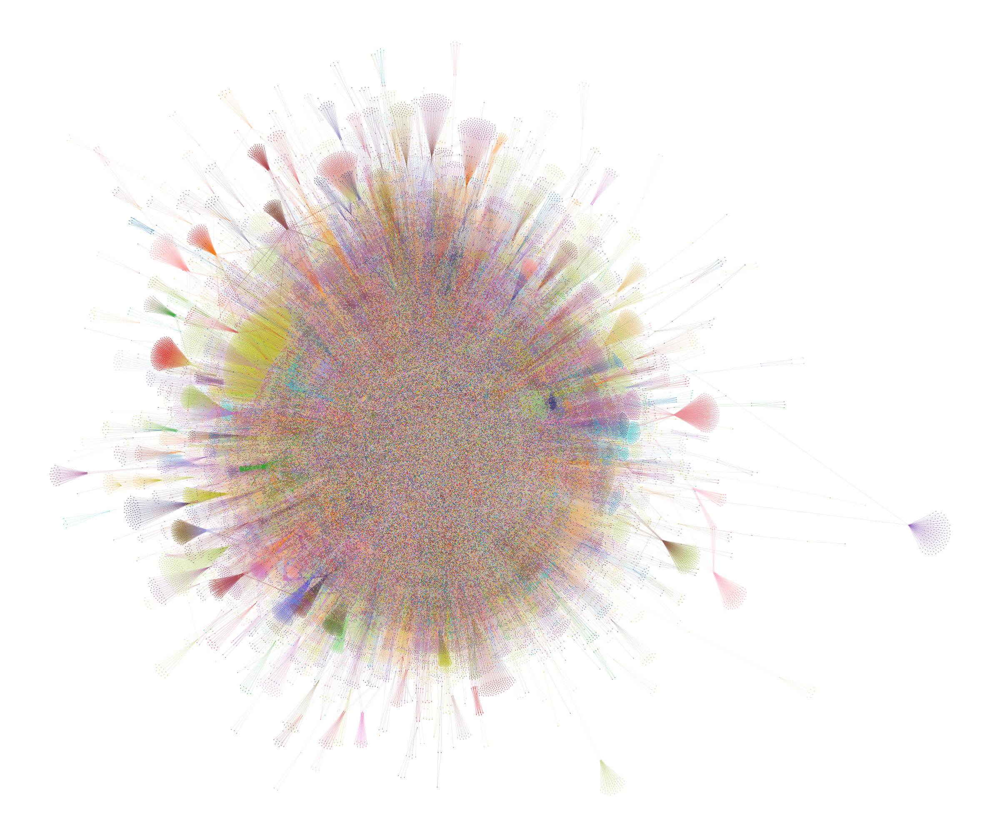

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x54661d1f0, at 0x4f71836b0>

In [15]:
state = minimize_nested_blockmodel_dl(g)
state.levels[0].draw(pos=pos, **dprms)

In [16]:
pos2 = sfdp_layout(g, groups=state.levels[0].b, gamma=.04) 


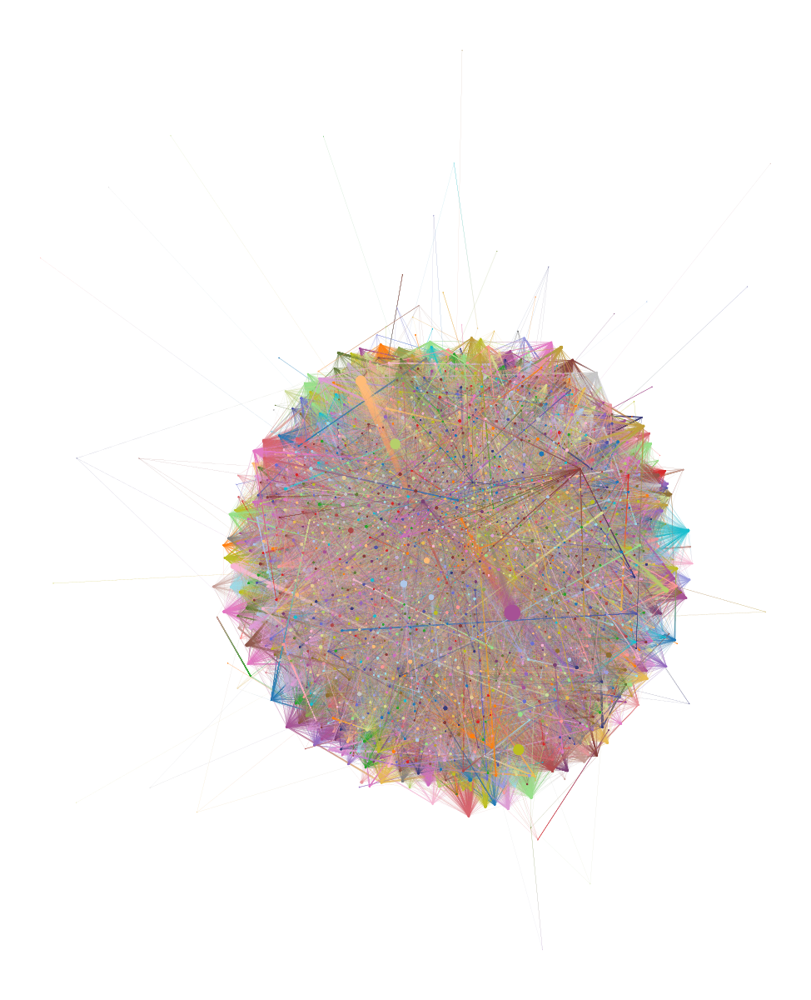

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x54661d1f0, at 0x564e018b0>

In [17]:
state.levels[0].draw(pos=pos2)#, edge_gradient=[], edge_color="#33333322", **dprms)

In [18]:
#!pip install umap-learn
#!pip install sentence-transformers

pos2

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x54661d1f0, at 0x4f4cd15b0>

In [19]:
texts_to_embedd = [
    ' '.join([y.title() if y else '' for y in G.nodes(data=True)[x].get('titles', [])])
    for x in G.nodes()
]

In [20]:
# from sentence_transformers import SentenceTransformer

# model = SentenceTransformer("all-mpnet-base-v2")#allenai-specter


# embeddings = model.encode(['texts_to_embedd']*20, show_progress_bar=True, batch_size=10)

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD

vectorizer = TfidfVectorizer(stop_words='english',norm='l1')
vectors = vectorizer.fit_transform(texts_to_embedd)

# Initialize the SVD object
svd = TruncatedSVD(n_components=100)
SVD_embedding = svd.fit_transform(vectors)

In [21]:
#

import matplotlib.pyplot as plt
import umap


graph_labels= state.levels[0].get_blocks()

# Apply UMAP
reducer = umap.UMAP(n_neighbors=50, min_dist=0.3, metric='cosine',target_weight=.5)
embedding = reducer.fit_transform(vectors, y=graph_labels)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


<Figure size 800x800 with 0 Axes>

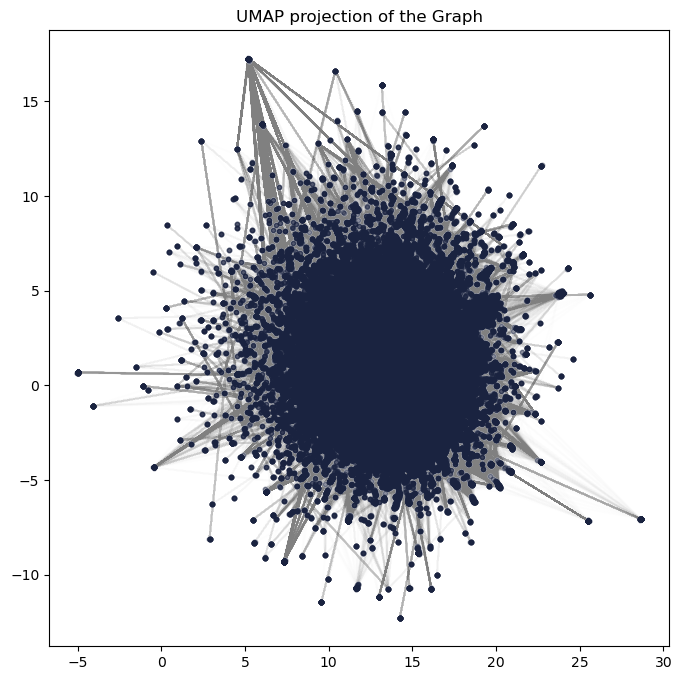

In [22]:
# Plotting
plt.figure(figsize=(8, 8))


# Prepare a mapping of node labels to indices for embedding
node_list = list(G.nodes())
node_to_index = {node: idx for idx, node in enumerate(node_list)}

# Plotting
plt.figure(figsize=(8, 8))

# Draw edges
for edge in G.edges():
    # Convert node labels to indices for the embedding
    points = embedding[[node_to_index[edge[0]], node_to_index[edge[1]]]]
    plt.plot(points[:, 0], points[:, 1], 'grey', alpha=0.01,zorder=1)

# Draw nodes
plt.scatter(embedding[:, 0], embedding[:, 1], c='white', s=10,alpha=1,zorder=2)

plt.scatter(embedding[:, 0], embedding[:, 1], c='#1a2340', s=10,alpha=.5,zorder=3)

plt.title('UMAP projection of the Graph')
plt.show()

In [23]:

import datamapplot
plot = datamapplot.create_interactive_plot(
embedding,[str(x) for x in graph_labels],
hover_text=texts_to_embedd,use_medoids=True,
    width=800,
    height=800,    point_radius_min_pixels=1,
    point_radius_max_pixels=4,

)
plot



/Users/Noich001/miniforge3/envs/network_epist_playground/lib/python3.12/site-packages/dask/dataframe/__init__.py:31: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [ ]:
#!pip install pyarrow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.0/26.0 MB 71.3 MB/s eta 0:00:0000:0100:01


In [ ]:
#!pip install dill

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 2.7 MB/s eta 0:00:00a 0:00:01


In [ ]:
import dill

with open('peptic_ulcer_graph_pre_1979.pkl', 'wb') as f:
    dill.dump(G, f)